In [1]:
import os
import torch
import torch.nn as nn
import math
import numpy as np

from rl_helpers.scalers import *
from torch.distributions import Bernoulli
from delivery_drone.game.socket_client import DroneGameClient, DroneState

pygame 2.6.1 (SDL 2.28.4, Python 3.12.9)
Hello from the pygame community. https://www.pygame.org/contribute.html


In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Using device: cuda
GPU: NVIDIA GeForce RTX 4060 Laptop GPU


In [3]:
client = DroneGameClient(port=5555)
client.connect()

Connecting to localhost:5555...
Connected to server at localhost:5555
Server has 6 game instance(s)


### State Variables

| Variable | Min | Max | Typical Range | Critical Threshold |
|----------|-----|-----|---------------|-------------------|
| drone_x | 0 | 1 | [0, 1] | - |
| drone_y | 0 | 1 | [0, 1] | - |
| drone_vx | -2.5 | 2.5 | [-1.5, 1.5] | - |
| drone_vy | -2.5 | 3.0 | [-0.5, 2.5] | - |
| drone_angle | -1 | 1 | [-0.5, 0.5] | < 0.111 for landing |
| drone_angular_vel | -1.5 | 1.5 | [-0.8, 0.8] | - |
| drone_fuel | 0 | 1 | [0, 1] | Episode ends at 0 |
| platform_x | 0 | 1 | [0.1, 0.9] | - |
| platform_y | 0 | 1 | [0.58, 0.92] | Platform spawns at [350, 550]px |
| distance_to_platform | 0 | 1.41 | [0, 1.2] | - |
| dx_to_platform | -1.125 | 1.125 | [-1, 1] | < ±0.0625 for landing |
| dy_to_platform | -1.083 | 1.083 | [-0.5, 0.8] | - |
| speed | 0 | 3.9 | [0, 3.0] | < 0.3 for landing |

In [4]:
def calc_velocity_alignment(state: DroneState):
    """
    Calculate how well the drone's velocity is aligned with optimal direction to platform.
    Returns cosine similarity: 1.0 = perfect alignment, -1.0 = opposite direction
    """
    # Optimal direction: from drone to platform
    optimal_dx = state.dx_to_platform
    optimal_dy = state.dy_to_platform
    optimal_norm = math.sqrt(optimal_dx**2 + optimal_dy**2)

    if optimal_norm < 1e-6:  # Already at platform
        return 1.0

    optimal_dx /= optimal_norm
    optimal_dy /= optimal_norm

    # Current velocity direction
    velocity_norm = state.speed
    if velocity_norm < 1e-6:  # Not moving
        return 0.0

    velocity_dx = state.drone_vx / velocity_norm
    velocity_dy = state.drone_vy / velocity_norm

    # Cosine similarity
    return velocity_dx * optimal_dx + velocity_dy * optimal_dy

In [5]:
# Velocity-magnitude-weighted distance reward
def calc_reward(state: DroneState, prev_state: DroneState = None):
    rewards = {}
    total_reward = 0

    # Time penalty
    minimum_time_penalty = 0
    maximum_time_penalty = 1
    rewards['time_penalty'] = -inverse_quadratic(
        state.distance_to_platform,
        decay=100,
        scaler=maximum_time_penalty-minimum_time_penalty) - minimum_time_penalty

    # Distance-based time penalty
    # Penalty gets smaller as drone gets closer to platform
    # Uses inverse quadratic function: higher penalty when far, reduces as distance decreases
    # Minimum penalty of 0.5, maximum of 2.0 per timestep
    total_reward += -0.5#rewards['time_penalty']

    velocity_alignment = calc_velocity_alignment(state)
    dist = state.distance_to_platform
    
    rewards['distance'] = 0
    rewards['hovering'] = 0

    if prev_state is not None:
        distance_delta = prev_state.distance_to_platform - state.distance_to_platform
        speed = state.speed
        
        # Calculate velocity toward platform
        if dist > 1e-6:
            velocity_toward_platform = (
                state.drone_vx * state.dx_to_platform +
                state.drone_vy * state.dy_to_platform
            ) / dist
        else:
            velocity_toward_platform = 0.0
        
        MIN_MEANINGFUL_SPEED = 0.15  # Require meaningful velocity
        
        # Only reward if FAST and ALIGNED and making PROGRESS
        if speed >= MIN_MEANINGFUL_SPEED and velocity_toward_platform > 0.1 and dist > 0.065:
            # Good: Moving fast toward platform
            speed_multiplier = 1.0 + speed * 2.0
            rewards['distance'] = float(np.clip(distance_delta * 1000 * speed_multiplier, -2, 5))
        elif distance_delta < -0.001:
            # BAD: Moving away from platform (distance increasing)
            rewards['distance'] = -2.0 * abs(distance_delta) * 1000  # Harsh penalty
            rewards['hovering'] = 0  # Don't double-penalize
        elif speed < 0.05:
            # Hovering
            rewards['hovering'] = -1.0
        elif speed < MIN_MEANINGFUL_SPEED:
            # Too slow
            rewards['hovering'] = -0.3
        else:
            rewards['distance'] = 0.0
            
    total_reward += rewards['distance']
    total_reward += rewards['hovering']

    # Angle penalty (define a distance based max threshold)
    abs_angle = abs(state.drone_angle)
    max_angle = 0.20
    max_permissible_angle = ((max_angle-0.111)*dist) + 0.111
    excess = abs_angle - max_permissible_angle # excess angle
    rewards['angle'] = -max(excess, 0) # maximum reward is 0 (we dont want it to reward hack for stability)

    total_reward += rewards['angle']

    # Speed - penalize excessive speed
    rewards['speed'] = 0
    speed = state.speed
    max_speed = 0.6
    if dist < 1:
        rewards['speed'] = -2 * max(speed-0.1, 0)
    else:
        rewards['speed'] = -1 * max(speed-max_speed, 0)
    total_reward += rewards['speed']

    # Penalize being below platform
    rewards['vertical_position'] = 0
    if state.dy_to_platform > 0:  # Platform is below drone (drone is above - GOOD)
        rewards['vertical_position'] = 0
    else:  # Drone is below platform (BAD!)
        rewards['vertical_position'] = state.dy_to_platform * 4.0  # Negative penalty
    total_reward += rewards['vertical_position']

    # Terminal
    rewards['terminal'] = 0
    if state.landed:
        rewards['terminal'] = 800.0 + state.drone_fuel * 100.0
    elif state.crashed:
        rewards['terminal'] = -200.0
        # Extra penalty for crashing far from target
        if state.distance_to_platform > 0.3:
            rewards['terminal'] -= 100.0
    total_reward += rewards['terminal']

    rewards['total'] = total_reward
    return rewards

### Deep Learning begins from here

In [6]:
def state_to_array(state, device='cpu'):
    """Convert DroneState dataclass to numpy array"""
    data = np.array([
        state.drone_x,
        state.drone_y,
        state.drone_vx,
        state.drone_vy,
        state.drone_angle,
        state.drone_angular_vel,
        state.drone_fuel,
        state.platform_x,
        state.platform_y,
        state.distance_to_platform,
        state.dx_to_platform,
        state.dy_to_platform,
        state.speed,
        float(state.landed),
        float(state.crashed)
    ])
    
    return torch.tensor(data, dtype=torch.float32, device=device)

In [7]:
class DroneGamerBoi(nn.Module):
    def __init__(self, state_dim=15):
        super().__init__()
        
        self.network = nn.Sequential(
            nn.Linear(state_dim, 128),
            nn.LayerNorm(128),  # Add normalization
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.LayerNorm(128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.LayerNorm(64),
            nn.ReLU(),
            nn.Linear(64, 3),
            nn.Sigmoid()
        )
        
    def forward(self, state):
        if isinstance(state, DroneState):
            state = state_to_array(state, device=device)
        
        return self.network(state)

In [8]:
class DroneTeacherBoi(nn.Module):
    def __init__(self, state_dim=15):
        super().__init__()
        
        self.network = nn.Sequential(
            nn.Linear(state_dim, 128),
            nn.LayerNorm(128),  # Add normalization
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.LayerNorm(128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.LayerNorm(64),
            nn.ReLU(),
            nn.Linear(64, 1) # output will be just a scalar
        )
        
    def forward(self, state):
        if isinstance(state, DroneState):
            state = state_to_array(state, device=device)
        
        return (self.network(state)
                .squeeze(-1)) # this will convert the tensor from [B, 1] to [B,]

## Generalized Advantage Estimation (GAE): How It Works

GAE is a technique for computing better advantage estimates in Actor-Critic methods. It solves the **bias-variance tradeoff** problem in advantage estimation.

### The Core Problem GAE Solves

**In Basic Actor-Critic**, we use simple TD error as the advantage:
$$A_t = \delta_t = r_t + \gamma V(s_{t+1}) - V(s_t)$$

**The problem:**
- ✓ **Low variance** (uses only one-step lookahead)
- ✗ **High bias** (relies heavily on critic's value estimate, which might be wrong early in training)

**Alternative: Monte Carlo returns** (like REINFORCE):
$$A_t = G_t - V(s_t) = \left(\sum_{k=0}^{\infty} \gamma^k r_{t+k}\right) - V(s_t)$$

**The problem:**
- ✗ **High variance** (sum of many random rewards)
- ✓ **Low bias** (uses actual rewards, not estimates)

**GAE's solution:** **Blend multiple TD estimates** with exponential weighting to get the best of both worlds!

---

## Key Innovation: Exponentially-Weighted TD Errors

### 1. Multi-Step TD Errors

Instead of just 1-step TD, we can compute n-step TD errors:

**1-step TD:** $\delta_t^{(1)} = r_t + \gamma V(s_{t+1}) - V(s_t)$

**2-step TD:** $\delta_t^{(2)} = r_t + \gamma r_{t+1} + \gamma^2 V(s_{t+2}) - V(s_t)$

**3-step TD:** $\delta_t^{(3)} = r_t + \gamma r_{t+1} + \gamma^2 r_{t+2} + \gamma^3 V(s_{t+3}) - V(s_t)$

**∞-step (Monte Carlo):** $\delta_t^{(\infty)} = G_t - V(s_t) = \sum_{k=0}^{\infty} \gamma^k r_{t+k} - V(s_t)$

### 2. GAE Formula

GAE takes an **exponentially-weighted average** of all these TD errors:

$$A_t^{\text{GAE}(\gamma, \lambda)} = \sum_{l=0}^{\infty} (\gamma \lambda)^l \delta_{t+l}$$

Where:
- $\gamma$ = discount factor (same as before, typically 0.99)
- $\lambda$ = GAE parameter controlling bias-variance tradeoff
- $\delta_{t+l} = r_{t+l} + \gamma V(s_{t+l+1}) - V(s_{t+l})$ = 1-step TD error at time $t+l$

**Expanded form:**
$$A_t^{\text{GAE}} = \delta_t + (\gamma\lambda)\delta_{t+1} + (\gamma\lambda)^2\delta_{t+2} + (\gamma\lambda)^3\delta_{t+3} + \ldots$$

### 3. What Lambda (λ) Controls

| λ value | Effect | Bias | Variance | Interpretation |
|---------|--------|------|----------|----------------|
| **λ = 0** | $A_t = \delta_t$ | High | Low | Pure 1-step TD (Actor-Critic) |
| **λ = 0.5** | Medium blending | Medium | Medium | Balanced |
| **λ = 0.95** | Heavy blending | Low | Medium | **PPO default** ✓ |
| **λ = 1.0** | $A_t = G_t - V(s_t)$ | None | High | Pure Monte Carlo (REINFORCE) |

**Rule of thumb:** λ = 0.95 is the sweet spot for most tasks!

---

## Efficient Computation: Backward Pass

Computing GAE directly from the formula would be slow. Instead, we use a **recursive backward pass**:

### Recursive Form

$$A_t^{\text{GAE}} = \delta_t + (\gamma\lambda) A_{t+1}^{\text{GAE}}$$

**Base case:** $A_T^{\text{GAE}} = 0$ (at terminal state)

### Implementation

```python
def compute_gae(rewards, values, dones, gamma=0.99, lambda_=0.95):
    """
    Compute GAE advantages using backward pass.
    
    Args:
        rewards: List of rewards [r_0, r_1, ..., r_T]
        values: List of value estimates [V(s_0), V(s_1), ..., V(s_T), V(s_{T+1})]
        dones: List of done flags [done_0, done_1, ..., done_T]
        gamma: Discount factor
        lambda_: GAE parameter
    
    Returns:
        advantages: List of GAE advantages
    """
    advantages = []
    gae = 0
    
    # Backward pass through time
    for t in reversed(range(len(rewards))):
        # Compute 1-step TD error
        delta = rewards[t] + gamma * values[t+1] * (1 - dones[t]) - values[t]
        
        # Accumulate GAE
        gae = delta + gamma * lambda_ * (1 - dones[t]) * gae
        
        # Insert at beginning (since we're going backwards)
        advantages.insert(0, gae)
    
    return advantages
```

**Why this works:**
- We process the episode **backwards** from T to 0
- At each step, we combine the current TD error with the accumulated GAE from future steps
- The $(1 - \text{done})$ term ensures we reset GAE at episode boundaries

---

## GAE vs Simple TD Error

### Visual Comparison

**Simple TD (λ=0):**
```
Time:     t      t+1    t+2    t+3    t+4
Rewards:  r_t    r₁     r₂     r₃     r₄
          |
          └──> δ_t = r_t + γV(s₁) - V(s_t)
               ↑
               Only uses immediate next state
```

**GAE (λ=0.95):**
```
Time:     t      t+1    t+2    t+3    t+4
Rewards:  r_t    r₁     r₂     r₃     r₄
          |      |      |      |      |
          └──────┴──────┴──────┴──────┘
          All weighted exponentially: δ_t + 0.95δ₁ + 0.95²δ₂ + ...
          ↑
          Uses information from many future steps
```

### Example Calculation

Given:
- Rewards: [1, 2, 3, 100] (landing!)
- Values: [10, 15, 20, 80, 0]
- γ = 0.99, λ = 0.95

**Step-by-step backward pass:**

**t=3 (terminal):**
```
δ₃ = 100 + 0.99 × 0 - 80 = 20
A₃ = 20 + 0.99 × 0.95 × 0 = 20
```

**t=2:**
```
δ₂ = 3 + 0.99 × 80 - 20 = 62.2
A₂ = 62.2 + 0.99 × 0.95 × 20 = 81.01
```

**t=1:**
```
δ₁ = 2 + 0.99 × 20 - 15 = 6.8
A₁ = 6.8 + 0.99 × 0.95 × 81.01 = 83.15
```

**t=0:**
```
δ₀ = 1 + 0.99 × 15 - 10 = 5.85
A₀ = 5.85 + 0.99 × 0.95 × 83.15 = 84.16
```

Notice how the landing reward at t=3 **propagates backwards** to influence all earlier advantages!

---

## GAE vs Other Methods

| Method | Advantage Formula | Bias | Variance | Updates |
|--------|------------------|------|----------|---------|
| **REINFORCE** | $G_t - b$ | None | Very High | Episodic |
| **Actor-Critic (TD)** | $\delta_t$ | High | Low | Per-step |
| **GAE (λ=0.95)** | $\sum (\gamma\lambda)^l \delta_{t+l}$ | Low | **Medium** ✓ | Episodic |
| **n-step TD** | $\sum_{k=0}^{n-1} \gamma^k r_{t+k} + \gamma^n V(s_{t+n}) - V(s_t)$ | Medium | Medium | Can be online |

---

## Integration with Actor-Critic

### Modified Training Flow

**Phase 1: Collect Full Episodes**
```
for each parallel game:
    states, actions, rewards, values, dones = []
    
    while not done:
        action = policy(state)
        value = critic(state)
        next_state, reward, done = env.step(action)
        
        # Store transition
        states.append(state)
        actions.append(action)
        rewards.append(reward)
        values.append(value)
        dones.append(done)
```

**Phase 2: Compute GAE Advantages**
```
# Get final bootstrap value
final_value = critic(final_state) if not done else 0
values.append(final_value)

# Compute GAE
advantages = compute_gae(rewards, values, dones, gamma=0.99, lambda_=0.95)
```

**Phase 3: Update Networks**
```
# Normalize advantages (optional but helps)
advantages = (advantages - mean(advantages)) / (std(advantages) + 1e-8)

# Critic loss: predict returns
returns = advantages + values[:-1]  # A + V = G
critic_loss = (critic(states) - returns)².mean()

# Actor loss: policy gradient with GAE advantages
actor_loss = -(log_probs * advantages).mean()
```

---

## Key Differences from Basic Actor-Critic

| Feature | Basic Actor-Critic | GAE Actor-Critic |
|---------|-------------------|------------------|
| **Advantage** | $\delta_t$ (1-step) | $\sum (\gamma\lambda)^l \delta_{t+l}$ (multi-step) |
| **Updates** | Per-step (online) | **Per-episode (batch)** |
| **Requires** | Next state value | **Full episode trajectory** |
| **Variance** | Low | **Lower** (smoothed) |
| **Bias** | High (early training) | **Much lower** |
| **Convergence** | Can be noisy | **Smoother, more stable** |

**Important:** GAE requires collecting **full episodes** before computing advantages, so it's no longer purely online like basic Actor-Critic!

---

## Hyperparameters

```python
# GAE-specific
gae_lambda = 0.95           # GAE parameter (bias-variance tradeoff)

# Standard
gamma = 0.99                # Discount factor
learning_rate_actor = 1e-3  # Actor learning rate
learning_rate_critic = 1e-3 # Critic learning rate
max_grad_norm = 0.5         # Gradient clipping

# Training
max_episode_steps = 300     # Episode length
num_parallel_games = 6      # Parallel environments
```

### Lambda (λ) Effects

| λ | Training Speed | Stability | When to Use |
|---|----------------|-----------|-------------|
| **0.0** | Fast (low variance) | Can be unstable | Simple tasks, good critic |
| **0.8** | Medium | Good | Balanced tasks |
| **0.95** | Slower but stable | **Very stable** ✓ | **Complex tasks (default)** |
| **0.99** | Slow (high variance) | Very stable | Very complex, long-horizon |
| **1.0** | Slowest | Most stable | Essentially REINFORCE |

---

## When to Use GAE

### ✅ Use GAE when:
- You want **lower variance** than basic Actor-Critic
- You can **collect full episodes** (not purely online)
- Working on tasks with **long credit assignment** (100+ steps)
- Basic Actor-Critic is too noisy/unstable
- As a stepping stone to **PPO** (PPO uses GAE!)

### ❌ Stick with basic TD when:
- Need **immediate online learning** (can't wait for episodes)
- Episodes are very short (<20 steps)
- Critic is very accurate (low bias already)

---

## Relationship to PPO

**GAE is a component of PPO!**

PPO = **GAE advantages** + **Clipped objective** + **Multi-epoch updates**

The training flow becomes:
```
1. Collect episodes → Compute GAE advantages
2. For K epochs:
      Update policy with clipped objective
      Update critic
3. Repeat
```

So implementing GAE is an important step toward PPO!

---

## Mathematical Intuition

**Why does exponential weighting work?**

Think of GAE as a **weighted voting system** for how good an action was:

- **Immediate next step** ($\delta_t$): Weight = 1.0
- **2 steps ahead** ($\delta_{t+1}$): Weight = 0.95
- **3 steps ahead** ($\delta_{t+2}$): Weight = 0.95² = 0.90
- **4 steps ahead** ($\delta_{t+3}$): Weight = 0.95³ = 0.86
- **10 steps ahead**: Weight = 0.95⁹ = 0.63

We trust nearby evidence more, but still consider long-term outcomes!

---

## Summary

**GAE Formula:**
> Exponentially-weighted blend of all TD errors!

**Three Keys:**
1. **λ parameter:** Controls bias-variance (0.95 is standard)
2. **Backward pass:** Efficient recursive computation
3. **Episode-based:** Requires full trajectories (not purely online)

**Why it's better than basic Actor-Critic:**
- Lower variance (smoother gradients)
- Lower bias (uses multi-step information)
- More stable training

**Trade-off:**
- Must wait for episodes to finish (no longer purely online)
- Slightly more complex to implement

For **drone landing**: GAE will provide much smoother training than basic Actor-Critic with TD error!

In [9]:
def compute_gae(rewards, values, dones, gamma=0.99, lambda_=0.95, device=None):
    """
    Compute GAE advantages using torch. Accepts python lists or torch tensors.

    Args:
        rewards: sequence (list or tensor) length T of rewards (r_0 ... r_{T-1})
        values: sequence (list or tensor) of value estimates. Preferably length T+1 (V_0 ... V_T).
                If only T values are provided, a 0 bootstrap is appended.
        dones:   sequence (list or tensor) length T of done flags (0/1 or booleans) or a scalar (broadcast).
        gamma:   discount factor
        lambda_: GAE lambda
        device:  torch device to place tensors on (defaults to values.device or cpu)
    Returns:
        advantages: torch tensor shape (T,) dtype float32 on chosen device
    """
    # Convert to tensors
    rewards = torch.as_tensor(rewards, dtype=torch.float32)
    values = torch.as_tensor(values, dtype=torch.float32)
    dones = torch.as_tensor(dones, dtype=torch.float32)

    # determine device
    if device is None:
        device = values.device if values.numel() > 0 else torch.device('cpu')
    rewards = rewards.to(device)
    values = values.to(device)
    dones = dones.to(device)

    T = rewards.shape[0]

    # flatten value shape
    if values.dim() > 1 and values.shape[-1] == 1:
        values = values.squeeze(-1)

    # ensure values has length T+1 (bootstrap). If only T provided, append 0.
    if values.shape[0] == T:
        values = torch.cat([values, torch.zeros(1, device=device, dtype=values.dtype)], dim=0)
    elif values.shape[0] < T + 1:
        raise ValueError(f"values must have length >= T (got {values.shape[0]} vs T+1={T+1})")

    # handle dones: if scalar or length 1, broadcast to T
    if dones.numel() == 1:
        dones = dones.expand(T)
    if dones.shape[0] != T:
        raise ValueError(f"dones must have length T (got {dones.shape[0]} vs T={T})")

    advantages = torch.zeros(T, dtype=torch.float32, device=device)
    gae = torch.tensor(0.0, dtype=torch.float32, device=device)

    for t in reversed(range(T)):
        mask = 1.0 - dones[t]  # 0 if done, 1 otherwise
        delta = rewards[t] + gamma * values[t + 1] * mask - values[t]
        gae = delta + gamma * lambda_ * mask * gae
        advantages[t] = gae

    return advantages

In [10]:
import time

from tqdm.notebook import trange, tqdm

In [11]:
# Reinitialize networks with updated learning rates
policy = DroneGamerBoi().to(device)
critic = DroneTeacherBoi().to(device)
policy_optimizer = torch.optim.AdamW(policy.parameters(), lr=3e-4)  # Reduced from 1e-3
critic_optimizer = torch.optim.AdamW(critic.parameters(), lr=1e-3)

print("Networks reinitialized successfully!")
print(f"Policy learning rate: 3e-4")
print(f"Critic learning rate: 1e-3")
print(f"Policy device: {next(policy.parameters()).device}")
print(f"Critic device: {next(critic.parameters()).device}")

Networks reinitialized successfully!
Policy learning rate: 3e-4
Critic learning rate: 1e-3
Policy device: cuda:0
Critic device: cuda:0


In [12]:
# training configurations
num_iterations = 1000
num_episodes = client.num_games

bellman_gamma = 0.99
gae_lambda = 0.9  # Reduced from 0.95 for lower variance

In [13]:
def collect_episodes(client: DroneGameClient, policy: DroneGamerBoi, max_steps=300):
    """
    Collect complete episodes for GAE computation.
    
    Args:
        client: DroneGameClient instance
        policy: Policy network
        max_steps: Maximum steps per episode (default: 300)
    
    Returns:
        List of tuples: (states, actions, rewards, done, final_state)
        - states: List of state tensors
        - actions: List of action tensors
        - rewards: List of reward scalars
        - done: Bool indicating if episode ended naturally (landed/crashed)
        - final_state: Final DroneState for bootstrap value computation
    """
    num_games = client.num_games
    
    # Initialize storage
    all_episodes = [
        {
            'states': [], 
            'actions': [], 
            'rewards': [],
            'prev_states': [],  # For velocity-weighted rewards
            'done': False,
            'final_state': None
        } 
        for _ in range(num_games)
    ]
    
    # Reset all games
    game_states = [client.reset(game_id) for game_id in range(num_games)]
    prev_game_states = [None] * num_games  # Track previous states for rewards
    step_counts = [0] * num_games
    
    while not all(ep['done'] for ep in all_episodes):
        # Batch active games
        batch_states = []
        active_game_ids = []
        
        for game_id in range(num_games):
            if not all_episodes[game_id]['done']:
                batch_states.append(state_to_array(game_states[game_id], device=device))
                active_game_ids.append(game_id)
        
        if len(batch_states) == 0:
            break
        
        # Batched inference
        batch_states_tensor = torch.stack(batch_states)
        
        with torch.no_grad():  # Don't need gradients during collection
            batch_action_probs = policy(batch_states_tensor)
        
        batch_dist = Bernoulli(probs=batch_action_probs)
        batch_actions = batch_dist.sample()
        
        # Execute actions for each active game
        for i, game_id in enumerate(active_game_ids):
            action = batch_actions[i]
            state_tensor = batch_states[i]
            
            # Store previous state for reward calculation
            prev_state = prev_game_states[game_id]
            current_state = game_states[game_id]
            
            # Execute action
            next_state, _, done, _ = client.step({
                "main_thrust": int(action[0]),
                "left_thrust": int(action[1]),
                "right_thrust": int(action[2])
            }, game_id)
            
            # Compute reward WITH prev_state for velocity-magnitude weighting
            reward_dict = calc_reward(next_state, prev_state=prev_state)
            reward = reward_dict['total']
            
            # Update step count
            step_counts[game_id] += 1
            
            # Check for timeout
            if step_counts[game_id] >= max_steps:
                if not next_state.landed:
                    reward -= 500  # Timeout penalty
                done = True  # Force termination
            
            # Store transition data (NO log_probs - we'll recompute them later)
            all_episodes[game_id]['states'].append(state_tensor)
            all_episodes[game_id]['actions'].append(action)
            all_episodes[game_id]['rewards'].append(reward)
            
            # Update state tracking
            prev_game_states[game_id] = current_state
            game_states[game_id] = next_state
            
            # Check if episode finished
            if done:
                all_episodes[game_id]['done'] = done  # True if landed/crashed, False if timeout
                all_episodes[game_id]['final_state'] = next_state
    
    # Return episodes with all necessary info (NO log_probs)
    return [
        (
            ep['states'],           # List of state tensors
            ep['actions'],          # List of action tensors  
            ep['rewards'],          # List of reward scalars
            ep['done'],             # Bool: True if natural end, False if timeout
            ep['final_state']       # Final DroneState for bootstrap
        )
        for ep in all_episodes
    ]

In [14]:
def evaluate_policy_simple(client, policy, max_steps=300, game_id=0, temperature=0.5, iteration=0, fig_ax=None):
    """
    Simple evaluation with static plots that reuse the same figure.
    Auto-detects reward components from calc_reward() output.
    """
    import matplotlib.pyplot as plt
    
    policy.eval()
    state = client.reset(game_id)
    prev_state = None
    
    # Initialize with empty dicts - will be populated dynamically
    history = {'step': []}
    accumulated = {}
    
    steps = 0
    done = False
    
    # Run episode
    while not done and steps < max_steps:
        with torch.no_grad():
            action_probs = policy(state)
            
        if temperature == 0:
            action = (action_probs > 0.5).float()
        else:
            adjusted_probs = torch.pow(action_probs, 1.0 / temperature)
            adjusted_probs = adjusted_probs / (adjusted_probs + torch.pow(1 - action_probs, 1.0 / temperature))
            dist = Bernoulli(probs=adjusted_probs)
            action = dist.sample()
        
        prev_state = state
        next_state, _, done, _ = client.step({
            "main_thrust": int(action[0]),
            "left_thrust": int(action[1]),
            "right_thrust": int(action[2])
        }, game_id)
        
        reward = calc_reward(next_state, prev_state=prev_state)
        
        # Initialize components on first step
        if steps == 0:
            for key in reward.keys():
                history[key] = []
                accumulated[key] = 0
        
        # Accumulate rewards
        for key in reward.keys():
            accumulated[key] += reward[key]
        
        # Store history
        history['step'].append(steps)
        for key in reward.keys():
            history[key].append(accumulated[key])
        
        state = next_state
        steps += 1
    
    policy.train()
    
    # Create or reuse figure
    if fig_ax is None:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    else:
        fig, (ax1, ax2) = fig_ax
        ax1.clear()
        ax2.clear()
    
    # Plot 1: All components (auto-detected, exclude 'total')
    components = [key for key in history.keys() if key not in ['step', 'total']]
    for comp in components:
        ax1.plot(history['step'], history[comp], label=comp, linewidth=2)
    
    ax1.set_xlabel('Time Steps', fontsize=11)
    ax1.set_ylabel('Accumulated Reward', fontsize=11)
    ax1.set_title(f'Accumulated Reward by Component (Iter {iteration})', fontweight='bold', fontsize=12)
    ax1.legend(loc='best', fontsize=9)
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Total
    if 'total' in history:
        ax2.plot(history['step'], history['total'], color='black', linewidth=3)
    ax2.set_xlabel('Time Steps', fontsize=11)
    ax2.set_ylabel('Accumulated Reward', fontsize=11)
    ax2.set_title(f'Total Accumulated Reward (Iter {iteration})', fontweight='bold', fontsize=12)
    ax2.grid(True, alpha=0.3)
    
    # Add result annotation
    status = "[LANDED]" if state.landed else "[CRASHED]"
    color = 'green' if state.landed else 'red'
    result_text = f"{status} | Steps: {steps} | Total: {accumulated['total']:.1f} | Fuel: {state.drone_fuel:.1%}"
    
    # Clear previous suptitle and add new one
    fig.suptitle(result_text, fontsize=13, fontweight='bold', color=color, y=1.02)
    
    plt.tight_layout()
    
    # Display the figure using IPython display
    display(fig)
    
    return {
        'landed': state.landed,
        'steps': steps,
        'total_reward': accumulated['total'],
        'final_fuel': state.drone_fuel
    }, (fig, (ax1, ax2))

In [15]:
steepness = 0.65
start = 300
end = 500

x = np.linspace(0, 1, num=num_iterations)
step_schedule = np.round(start + (end - start) * x**steepness).astype(np.int32)

  0%|          | 0/1000 [00:00<?, ?it/s]

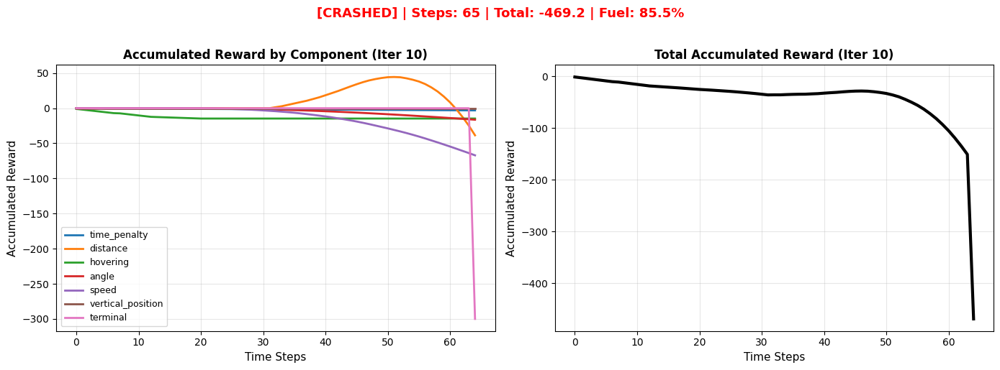

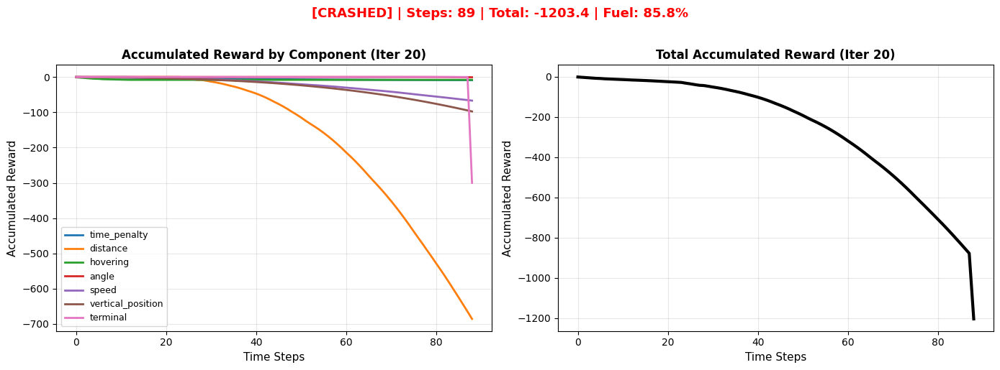

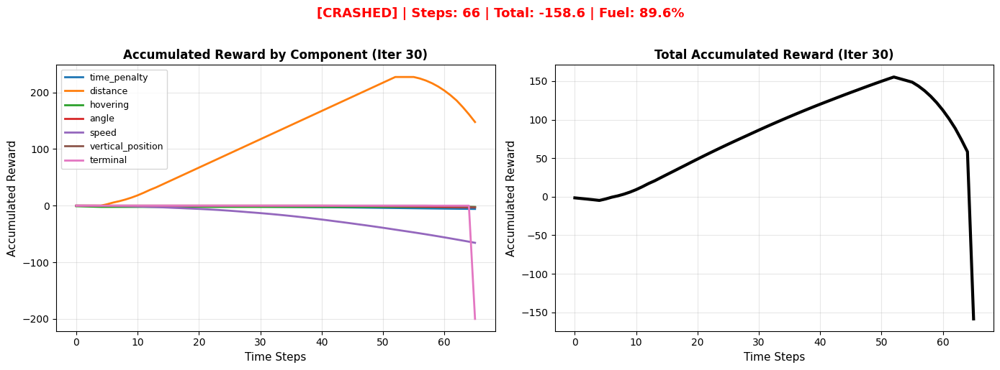

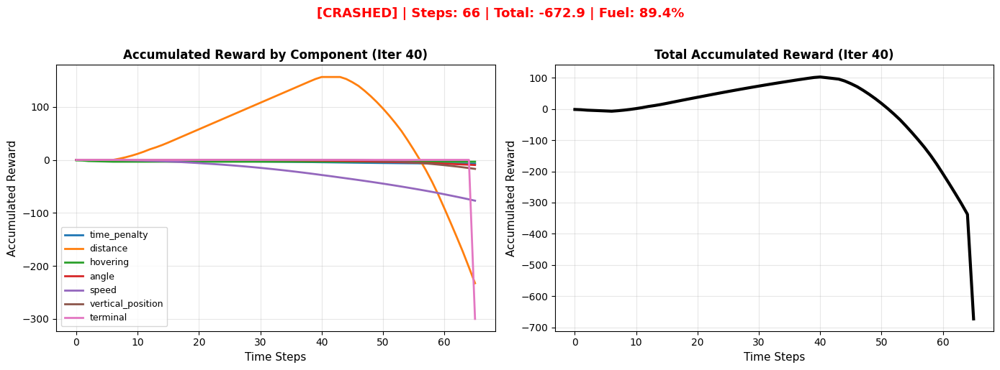

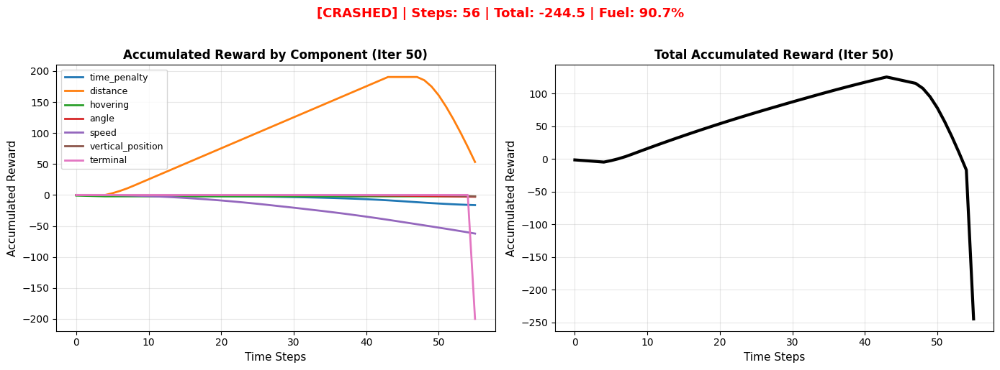

...

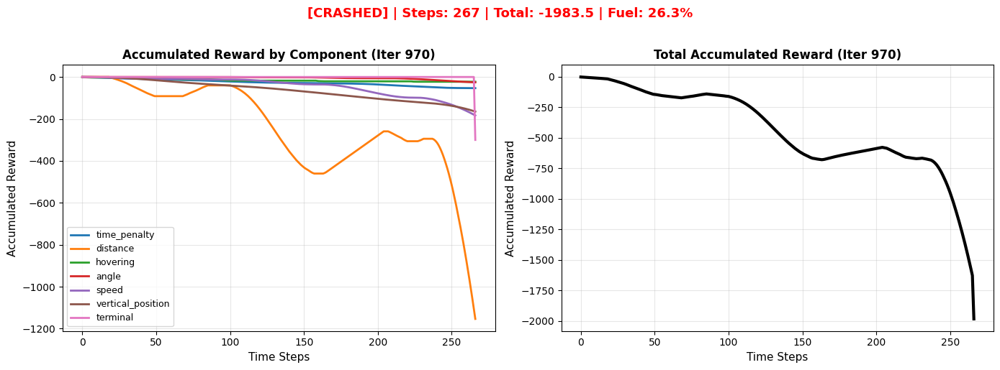

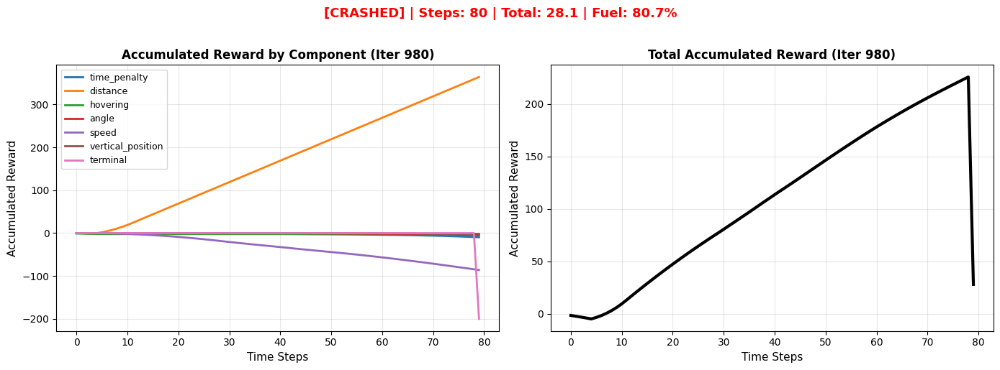

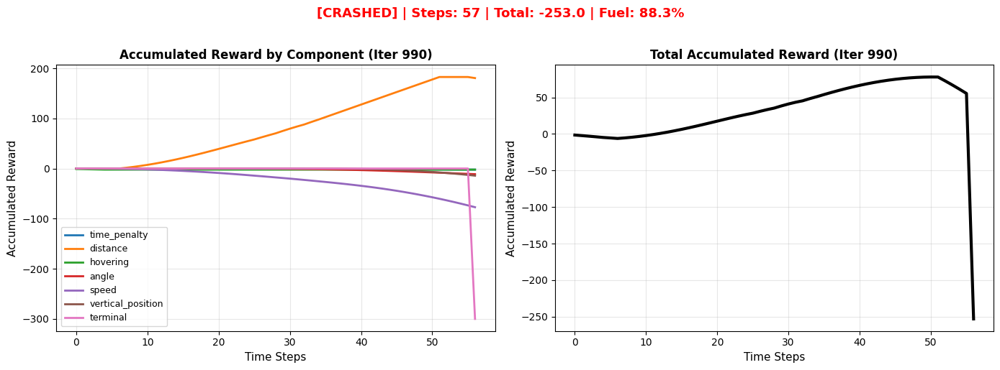

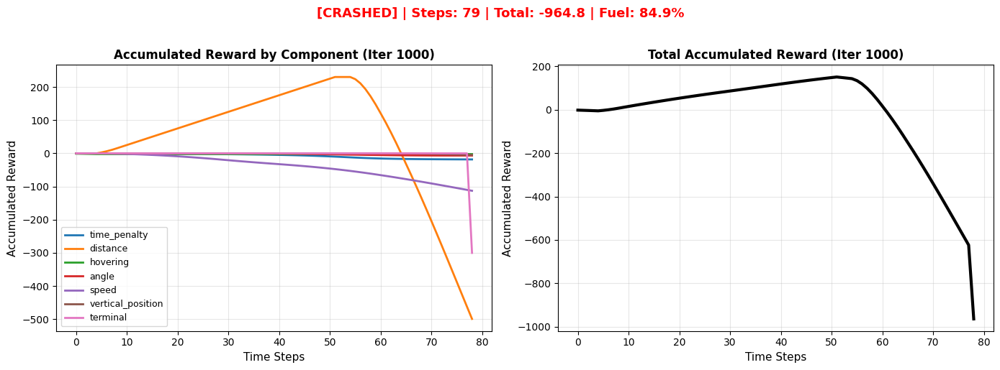

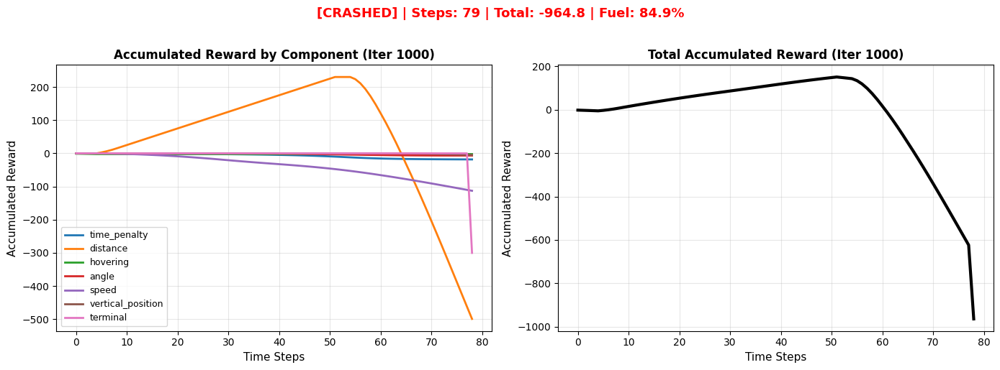

In [16]:
# Training loop with fixed value consistency

# Evaluation settings
eval_interval = 10        # Evaluate every N iterations
eval_temperature = 0.3    # Sampling temperature for eval
num_games = client.num_games

# Shared figure object
eval_fig_ax = None

tqdm_iterations = trange(num_iterations, desc='', total=num_iterations)

for iteration in tqdm_iterations:
    max_steps = step_schedule[iteration]
    
    episodes = collect_episodes(client, policy, max_steps=int(max_steps))
    
    episode_lengths = []
    episode_rewards = []
    num_successes = 0
    
    # Store losses as lists for logging
    actor_losses_list = []
    critic_losses_list = []

    # Collect all data for batch processing
    all_advantages = []
    all_returns = []
    all_states = []
    all_actions = []

    # SINGLE PASS: Compute values, advantages, returns together (FIX #1)
    for (states, actions, rewards, done, final_state) in episodes:
        episode_lengths.append(len(states))
        episode_rewards.append(sum(rewards))

        # Stack states and actions into tensors
        states_tensor = torch.stack(states)
        actions_tensor = torch.stack(actions)

        # Compute values ONCE (with gradients)
        values = critic(states_tensor)

        # Get bootstrap value
        if done:  # Episode ended naturally
            bootstrap_value = 0.0
        else:  # Truncated by max_steps
            with torch.no_grad():
                bootstrap_value = critic(state_to_array(final_state, device=device)).item()

        # Append bootstrap: [V(s_0), ..., V(s_T), V(s_{T+1})]
        # Use DETACHED values for GAE computation
        values_with_bootstrap = torch.cat([
            values.detach(),
            torch.tensor([bootstrap_value], device=device)
        ])

        # Compute GAE advantages with detached values
        dones = [False] * len(rewards)
        if done:
            dones[-1] = True

        advantages = compute_gae(
            rewards,
            values_with_bootstrap.cpu().numpy(),
            dones,
            gamma=bellman_gamma,
            lambda_=gae_lambda,
            device=device
        )

        # Returns from SAME values (detached for target)
        returns = advantages + values.detach()

        # Store for batch processing
        all_advantages.append(advantages)
        all_returns.append(returns)
        all_states.append(states_tensor)
        all_actions.append(actions_tensor)

        # Track success
        if done and final_state.landed:
            num_successes += 1

    # Normalize advantages across ALL episodes (not per-episode)
    all_advantages_cat = torch.cat(all_advantages)
    adv_mean = all_advantages_cat.mean()
    adv_std = all_advantages_cat.std()
    
    if adv_std > 1e-8:
        all_advantages = [(adv - adv_mean) / (adv_std + 1e-8) for adv in all_advantages]
    else:
        all_advantages = [(adv - adv_mean) for adv in all_advantages]

    # Second pass: compute losses with normalized advantages
    total_critic_loss = None
    total_actor_loss = None

    for i in range(len(episodes)):
        states_tensor = all_states[i]
        actions_tensor = all_actions[i]
        advantages = all_advantages[i]
        returns = all_returns[i]

        # Recompute values for loss (with gradients)
        values = critic(states_tensor)

        # Critic loss with WEAKER regularization (FIX #2)
        critic_loss = ((values - returns) ** 2).mean()
        value_reg = 0.0001 * (values ** 2).mean()  # 100x weaker than before
        critic_loss = critic_loss + value_reg

        # Actor loss with entropy bonus (FIX #3)
        action_probs = policy(states_tensor)
        # Clamp probabilities to prevent NaN in Bernoulli
        action_probs = torch.clamp(action_probs, 1e-8, 1 - 1e-8)
        dist = Bernoulli(probs=action_probs)
        log_probs = dist.log_prob(actions_tensor).sum(dim=1)
        entropy = dist.entropy().mean()
        
        # Add entropy bonus to encourage exploration
        actor_loss = -(log_probs * advantages.detach()).mean() - 0.01 * entropy

        # Check for NaN
        if torch.isnan(critic_loss) or torch.isnan(actor_loss):
            print(f"\nWARNING: NaN detected at iteration {iteration}, episode {i}")
            print(f"Values: min={values.min():.2f}, max={values.max():.2f}")
            print(f"Returns: min={returns.min():.2f}, max={returns.max():.2f}")
            print(f"Advantages: min={advantages.min():.2f}, max={advantages.max():.2f}")
            print(f"Action probs: min={action_probs.min():.2f}, max={action_probs.max():.2f}")
            continue  # Skip this episode

        # Track for logging (as scalars)
        actor_losses_list.append(actor_loss.item())
        critic_losses_list.append(critic_loss.item())

        # Accumulate losses as TENSORS (preserves computation graph)
        if total_critic_loss is None:
            total_critic_loss = critic_loss
            total_actor_loss = actor_loss
        else:
            total_critic_loss = total_critic_loss + critic_loss
            total_actor_loss = total_actor_loss + actor_loss

    # Skip update if no valid episodes
    if total_critic_loss is None or total_actor_loss is None:
        print(f"Skipping iteration {iteration} - all episodes had NaN")
        continue

    # Average losses across episodes (still tensors with gradients!)
    num_valid_episodes = len(actor_losses_list)
    avg_critic_loss = total_critic_loss / num_valid_episodes
    avg_actor_loss = total_actor_loss / num_valid_episodes

    # Update critic
    critic_optimizer.zero_grad()
    avg_critic_loss.backward()
    torch.nn.utils.clip_grad_norm_(critic.parameters(), max_norm=0.5)
    critic_optimizer.step()

    # Update actor
    policy_optimizer.zero_grad()
    avg_actor_loss.backward()
    torch.nn.utils.clip_grad_norm_(policy.parameters(), max_norm=0.5)
    policy_optimizer.step()
    
    # Progress tracking
    avg_reward = sum(episode_rewards) / num_games
    avg_steps = sum(episode_lengths) / num_games
    avg_actor_loss_val = sum(actor_losses_list) / num_valid_episodes if actor_losses_list else float('nan')
    avg_critic_loss_val = sum(critic_losses_list) / num_valid_episodes if critic_losses_list else float('nan')
    
    tqdm_iterations.set_description(
        f'Success: {num_successes}/{num_games} | '
        f'Avg Reward: {avg_reward:.1f} | '
        f'Actor: {avg_actor_loss_val:.4f} | '
        f'Critic: {avg_critic_loss_val:.4f} | '
        f'Steps: {avg_steps:.1f}'
    )
    
    # Periodic evaluation
    if (iteration + 1) % eval_interval == 0:
        eval_result, eval_fig_ax = evaluate_policy_simple(
            client, 
            policy, 
            max_steps=500,
            temperature=eval_temperature,
            iteration=iteration + 1,
            game_id=0,
            fig_ax=eval_fig_ax
        )

In [17]:
torch.save(policy.state_dict(), './models/actor-critic-GAE/drone_policy_v1.pth')

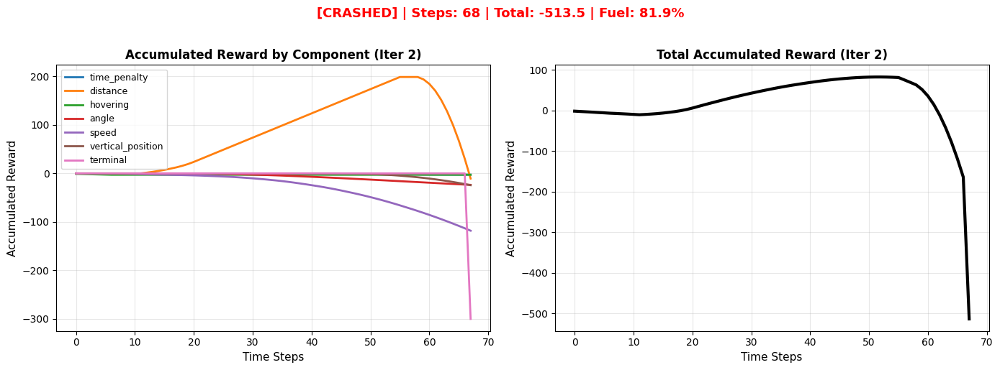

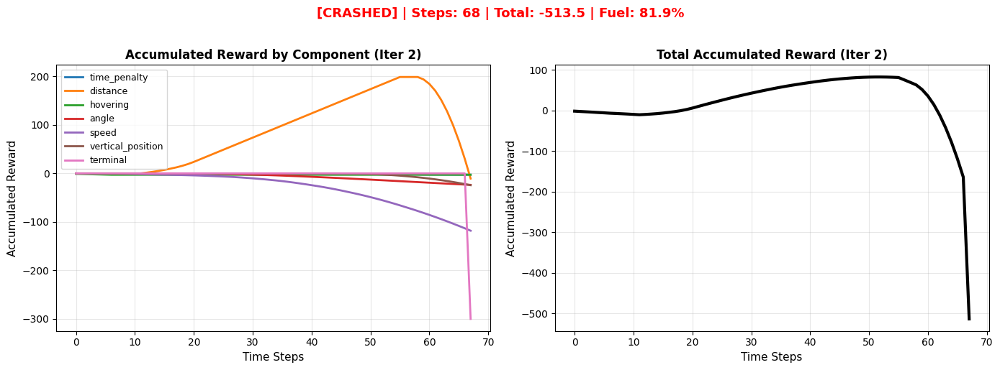

In [18]:
eval_result, eval_fig_ax = evaluate_policy_simple(
            client, 
            policy, 
            max_steps=500,
            temperature=0.3,
            iteration=1 + 1,
            game_id=0,
            fig_ax=None
        )